# TREAT-MMTB 2026 Task 1: Cavity Detection & Segmentation Baseline(26.05.22v)

This baseline uses **nnU-Net v2** for 2D cavity segmentation on chest X-rays.

nnU-Net is a self-configuring framework for medical image segmentation — it automatically adapts preprocessing, architecture, and training pipeline based on the dataset properties.

- Paper: [nnU-Net revisited (2024)](https://www.nature.com/articles/s41592-024-02233-6)
- GitHub: [MIC-DKFZ/nnUNet](https://github.com/MIC-DKFZ/nnUNet)

## Directory Structure
```
Task1/
├── Data/
│   ├── train/
│   │   ├── CXR/                          # Raw 2D DICOM files
│   │   └── CXR_label/                    # Cavity masks (.nii.gz)
│   ├── test/
│   │   └── CXR/                          # Raw 2D DICOM files (no labels)
│   │
│   └── train.csv                         # train data metadata
│
├── Code/
│   └──  task1_explain_baseline.ipynb             # This notebook
│
└── info.txt
```

**Note:**
- Cavity-negative cases use a blank 512x512 mask (all zeros) to maintain data pairs.
- Paths in this notebook are examples. Adjust to your environment as needed.
- This notebook is provided as a reference with pre-executed outputs.
- Dataset access will be granted only to registered participants.
- Participants submit predicted cavity masks (`.nii.gz`) for test images.

## Preprocessing

Converts raw DICOM CXR images and cavity masks into nnU-Net compatible `.nii.gz` format.

| Channel | Suffix | Method |
|---------|--------|--------|
| Ch0 | `_0000` | Monochrome1 inversion → Min-Max → 512x512 resize|
| Ch1 | `_0001` | Monochrome1 inversion → Min-Max → CLAHE (clipLimit=1.0, grid=8x8) → 512x512 resize |
| Ch2 | `_0002` | Duplicate of Ch0 (to match 3-channel input required by the model) |

Update `DIR_IN_IMG`, `DIR_IN_MASK`, and `DIR_OUT_BASE` before running.

### Check Raw Image, Preprocessing Image

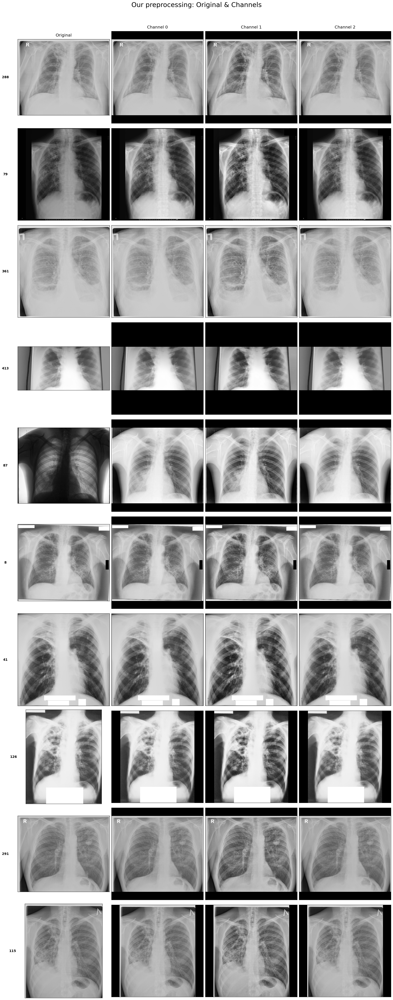


In [ ]:
import os
import glob
import cv2
import pydicom
import nibabel as nib
import SimpleITK as sitk
import numpy as np
from tqdm.notebook import tqdm

TARGET_SIZE = (512, 512)

# data path
DIR_IN_IMG = 'SELECT_YOUR_DICOM_DIR_PATH'       # e.g. /data/Task1/Data/train/CXR
DIR_IN_MASK = 'SELECT_YOUR_MASK_DIR_PATH'        # e.g. /data/Task1/Data/train/CXR_label

# result path
DIR_OUT_BASE = 'SELECT_YOUR_OUTPUT_DIR_PATH'     # e.g. /workspace/nnUNet_data/nnUNet_raw/Dataset002_Task1
DIR_OUT_IMG = os.path.join(DIR_OUT_BASE, "imagesTr")
DIR_OUT_LBL = os.path.join(DIR_OUT_BASE, "labelsTr")

os.makedirs(DIR_OUT_IMG, exist_ok=True)
os.makedirs(DIR_OUT_LBL, exist_ok=True)

# define function
def resize_and_pad(img, target_size=(512, 512), is_mask=False):

    """Resize with aspect ratio preserved, zero-pad to target size."""

    h, w = img.shape[:2]
    th, tw = target_size
    scale = min(th / h, tw / w)

    nw, nh = int(w * scale), int(h * scale)

    interp = cv2.INTER_NEAREST if is_mask else cv2.INTER_LINEAR
    resized = cv2.resize(img, (nw, nh), interpolation=interp)

    padded = np.zeros(target_size, dtype=img.dtype)
    top = (th - nh) // 2
    left = (tw - nw) // 2
    padded[top:top+nh, left:left+nw] = resized

    return padded


def save_nifti(data, save_path):
    nii = nib.Nifti1Image(data.astype(np.float32), affine=np.eye(4))
    nib.save(nii, save_path)


def save_mask_nifti(data, save_path):
    nii = nib.Nifti1Image(data.astype(np.uint8), affine=np.eye(4))
    nib.save(nii, save_path)


dcm_files = sorted(glob.glob(os.path.join(DIR_IN_IMG, "*.dcm")))
print(f"Start preprocessing: n={len(dcm_files)}")

for dcm_path in tqdm(dcm_files):
    filename = os.path.basename(dcm_path)
    our_id = os.path.splitext(filename)[0]

    mask_files = glob.glob(os.path.join(DIR_IN_MASK, f"{our_id}*.nii.gz*"))
    if not mask_files:
        print(f"Skip {our_id}: no mask")
        continue

    try:
        ds = pydicom.dcmread(dcm_path, force=True)
        raw_pixels = ds.pixel_array.astype(np.float32)

        # MONOCHROME1 inversion
        if getattr(ds, 'PhotometricInterpretation', '') == 'MONOCHROME1':
            raw_pixels = np.max(raw_pixels) - raw_pixels

        # Min-Max normalization
        base_norm = (raw_pixels - raw_pixels.min()) / (raw_pixels.max() - raw_pixels.min() + 1e-8)

        # Channel 0
        ch0 = resize_and_pad(base_norm, TARGET_SIZE, is_mask=False)

        # Channel 1
        ch1_uint8 = (base_norm * 255).astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8, 8))
        ch1 = clahe.apply(ch1_uint8).astype(np.float32) / 255.0
        ch1 = resize_and_pad(ch1, TARGET_SIZE, is_mask=False)

        # Ch2: duplicate of Ch0 (3-channel padding)
        ch2 = ch0.copy()

        # Mask
        mask_obj = sitk.ReadImage(mask_files[0])
        raw_mask = sitk.GetArrayFromImage(mask_obj)

        if raw_mask.ndim == 3:
            raw_mask = raw_mask.squeeze()

        raw_mask = (raw_mask > 0).astype(np.uint8)
        processed_mask = resize_and_pad(raw_mask, TARGET_SIZE, is_mask=True)

        # Save
        save_nifti(ch0, os.path.join(DIR_OUT_IMG, f"{our_id}_0000.nii.gz"))
        save_nifti(ch1, os.path.join(DIR_OUT_IMG, f"{our_id}_0001.nii.gz"))
        save_nifti(ch2, os.path.join(DIR_OUT_IMG, f"{our_id}_0002.nii.gz"))
        save_mask_nifti(processed_mask, os.path.join(DIR_OUT_LBL, f"{our_id}.nii.gz"))

    except Exception as e:
        print(f"{our_id} error: {e}")

print("Done")

## How to Run

### 1. Install nnU-Net v2
```bash
pip install nnunetv2
```

### 2. Set Environment Variables
```bash
export nnUNet_raw="/path/to/nnUNet_raw"
export nnUNet_preprocessed="/path/to/nnUNet_preprocessed"
export nnUNet_results="/path/to/nnUNet_results"
```

### 3. Run Preprocessing
Run the preprocessing cell above to convert DICOM → nnU-Net format.

### 4. nnU-Net Plan & Preprocess
```bash
nnUNetv2_plan_and_preprocess -d 002 --verify_dataset_integrity
```

### 5. Train
```bash
nnUNetv2_train 002 2d 0
```

### 6. Inference
```bash
nnUNetv2_predict -i INPUT_FOLDER -o OUTPUT_FOLDER -d 002 -c 2d -f 0
```

---

## Baseline Performance (nnU-Net v2)

| Metric | Score |
|--------|-------|
| Mean Validation DSC | 0.3061 |

Good luck, and we look forward to seeing your results!

## Notes

- Cavity-negative cases use a blank 512x512 mask (all zeros).
- Participants are free to use any segmentation framework — nnU-Net is provided as a baseline reference only.